# Manual Multi-Day CSV Loading and Analysis
Specify your list of CSV file paths (one per day) in `csv_paths`, then run all cells.

In [4]:
import pandas as pd
import ast
from pathlib import Path
import matplotlib.pyplot as plt

# 1) Manually list your 5 daily CSV file paths here:
csv_paths = [
    Path(r"C:\store\git\km-stat-activity\data\real\20250414\km_stat_acer_20250414_processed.csv"),
    Path(r"C:\store\git\km-stat-activity\data\real\20250415\km_stat_acer_20250415_processed.csv"),
    Path(r"C:\store\git\km-stat-activity\data\real\20250416\km_stat_acer_20250416_processed.csv"),
    Path(r"C:\store\git\km-stat-activity\data\real\20250417\km_stat_acer_20250417_processed.csv"),
    Path(r"C:\store\git\km-stat-activity\data\real\20250418\km_stat_acer_20250418_processed.csv"),
    Path(r"C:\store\git\km-stat-activity\data\real\20250421\km_stat_acer_20250421_processed.csv"),
    Path(r"C:\store\git\km-stat-activity\data\real\20250422\km_stat_acer_20250422_processed.csv"),
    Path(r"C:\store\git\km-stat-activity\data\real\20250423\km_stat_acer_20250423_processed.csv"),
    Path(r"C:\store\git\km-stat-activity\data\real\20250424\km_stat_acer_20250424_processed.csv"),
    Path(r"C:\store\git\km-stat-activity\data\real\20250425\km_stat_acer_20250425__processed.csv"),
]

# 2) Read, parse x/y lists and dates for each day
dfs = []
for path in csv_paths:
    df = pd.read_csv(
        path,
        converters={
            "x": lambda s: ast.literal_eval(s) if isinstance(s, str) else [],
            "y": lambda s: ast.literal_eval(s) if isinstance(s, str) else []
        },
        parse_dates=["start_date_time", "end_date_time"]
    )
    # Ensure a 'date' column exists
    if "date" not in df.columns:
        df["date"] = df["start_date_time"].dt.date
    else:
        df["date"] = pd.to_datetime(df["date"]).dt.date
    dfs.append(df)

# 3) Concatenate all days into one DataFrame
df_all = pd.concat(dfs, ignore_index=True)
print(f"Loaded and concatenated {len(dfs)} files. Total rows: {len(df_all)}")

Loaded and concatenated 10 files. Total rows: 510444


In [5]:
# 4) Define time segments (08:30-10:00, 11:00-12:30, 13:30-15:30, 15:30-17:00, 17:00-17:30)
def time_segment(ts):
    h = ts.hour + ts.minute/60
    if 8.5  <= h < 10:    return "morning_start"
    if 11   <= h < 12.5:  return "pre_lunch"
    if 13.5 <= h < 15.5:  return "post_lunch"
    if 15.5 <= h < 17:    return "afternoon_peak"
    if 17   <= h < 17.5:  return "end_of_day"
    return "other"

df_all["segment"] = df_all["start_date_time"].map(time_segment)
print("Segments assigned. Unique segments:", df_all["segment"].unique())

Segments assigned. Unique segments: ['morning_start' 'other' 'pre_lunch' 'post_lunch' 'afternoon_peak'
 'end_of_day']


In [6]:
# 5) Example: summarize avg_speed by date and segment for a single user
user_id = "013d5cac-f09d-48a5-bff1-00d81c91b017"  # Replace with desired profile_guid
df_user = df_all[df_all["profile_guid"] == user_id]
features = ["x_direction_changes", "y_direction_changes", "bbox_area", "avg_speed", "avg_acceleration", "mouse_idle_ratio", "movement_entropy", "linearity"]
summary = df_user.groupby(["date", "segment"])[features].mean().reset_index()
display(summary)

,date,segment,x_direction_changes,y_direction_changes,bbox_area,avg_speed,avg_acceleration,mouse_idle_ratio,movement_entropy,linearity
0,2025-04-14,afternoon_peak,14.494382,13.876404,9.543421e+05,118.570687,-1.964296e-02,0.730315,2.310463,0.136683
1,2025-04-14,end_of_day,7.413793,7.137931,6.564394e+05,79.451619,5.149856e-04,0.875757,1.073335,0.120727
2,2025-04-14,morning_start,20.368421,18.394737,1.055990e+06,166.306713,5.325695e-02,0.624234,3.220617,0.091127
3,2025-04-14,other,8.528689,7.926230,6.409668e+05,75.363160,2.124286e-02,0.846348,1.318609,0.075953
4,2025-04-14,post_lunch,21.470588,20.672269,1.119208e+06,161.070557,-2.662913e-02,0.598812,3.387561,0.097478
5,2025-04-14,pre_lunch,3.292135,3.089888,2.442794e+05,24.035196,-4.294192e-02,0.928629,0.625815,0.083921
6,2025-04-15,afternoon_peak,4.887640,5.146067,3.783806e+05,42.005494,2.373733e-02,0.917459,0.713833,0.138411
7,2025-04-15,end_of_day,15.033333,18.066667,8.917875e+05,131.570051,-1.500415e-01,0.712052,2.435616,0.116478
8,2025-04-15,other,3.812000,3.874000,3.078106e+05,36.927530,1.342485e-02,0.932520,0.579795,0.055943
9,2025-04-15,post_lunch,16.865546,17.806723,9.882378e+05,145.988653,-3.214657e-02,0.668006,2.789138,0.113096


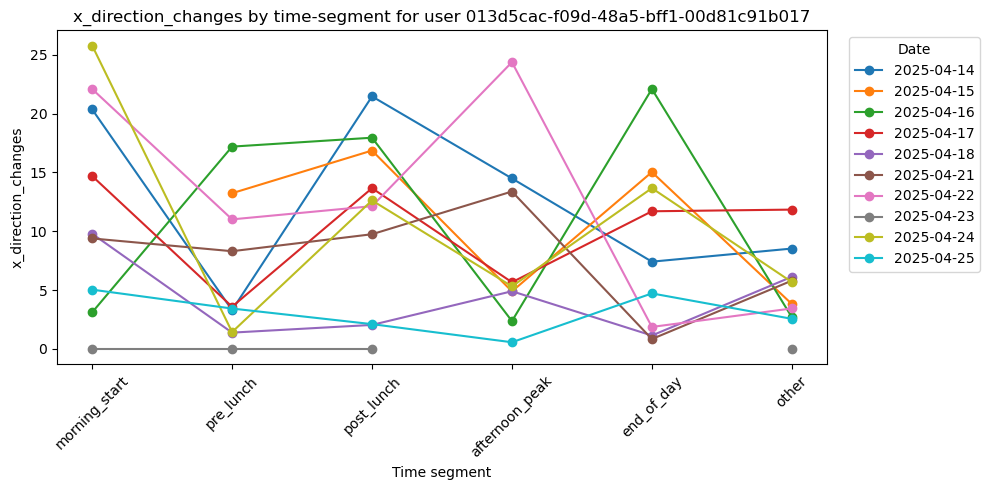

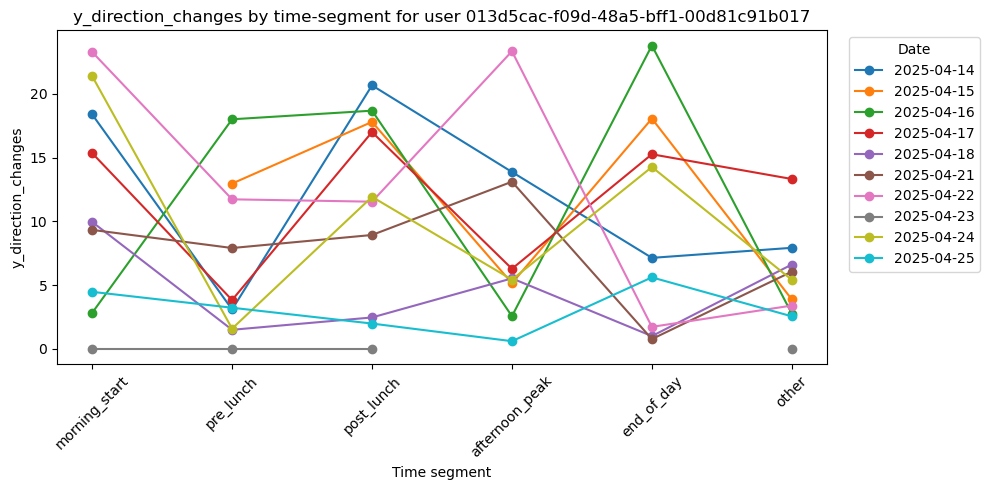

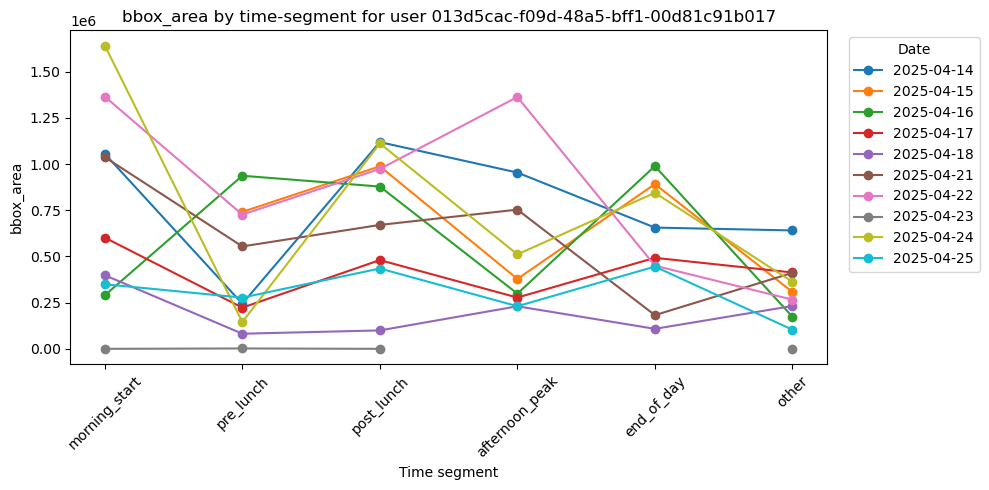

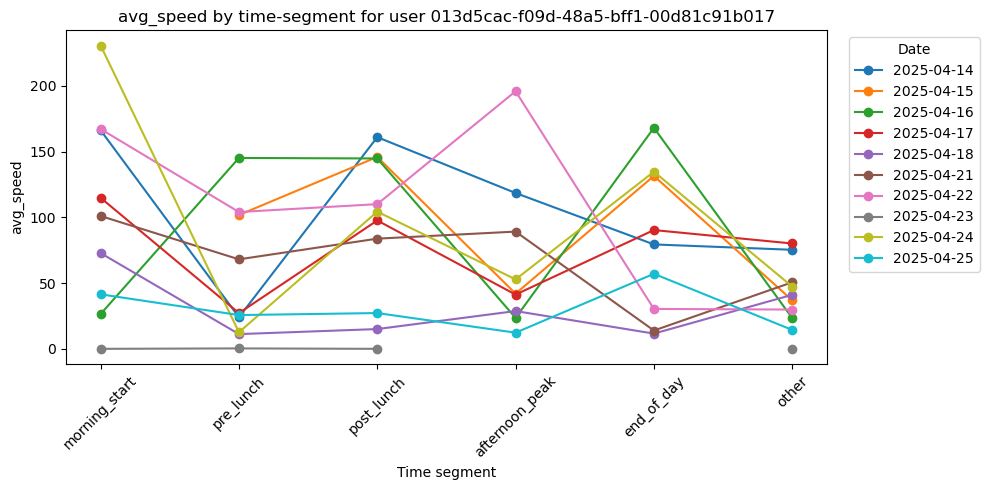

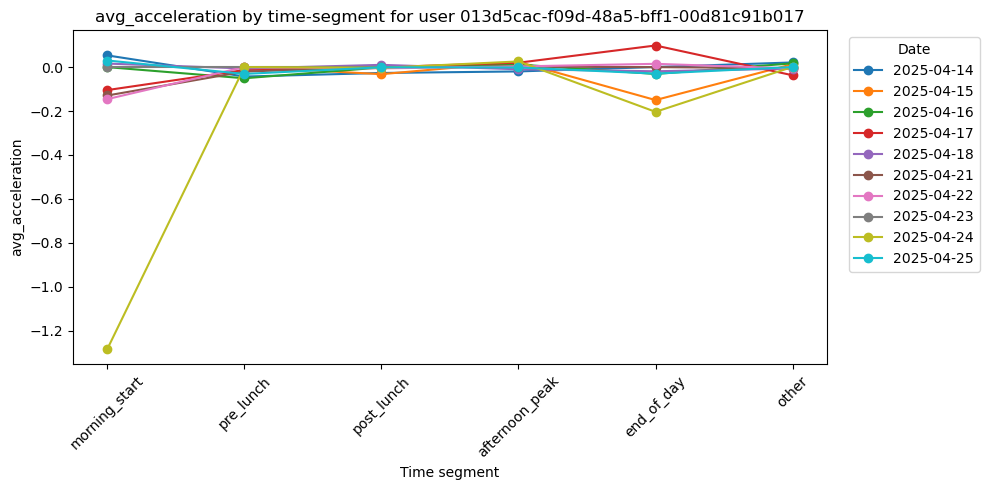

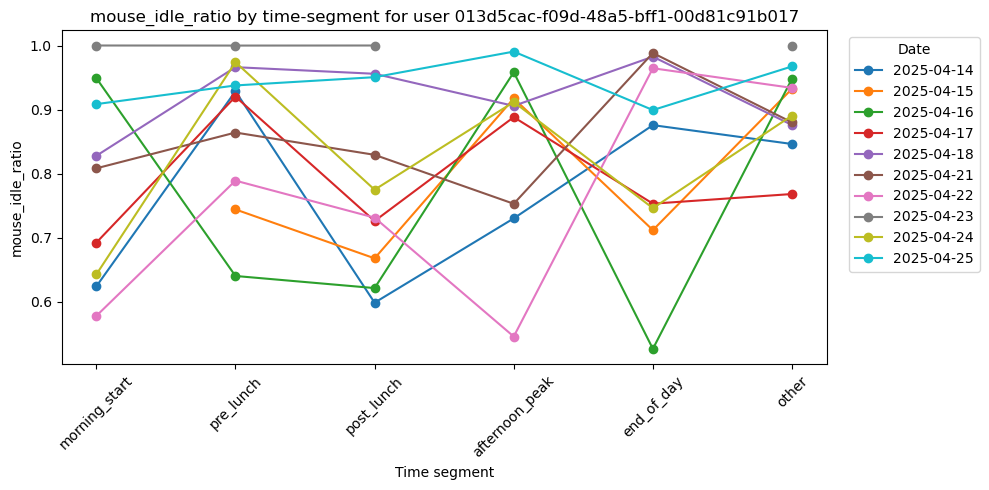

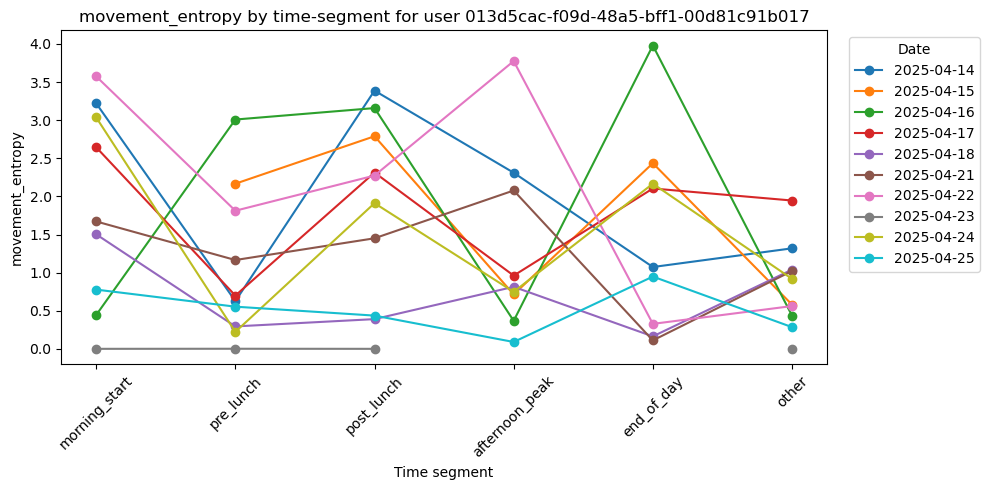

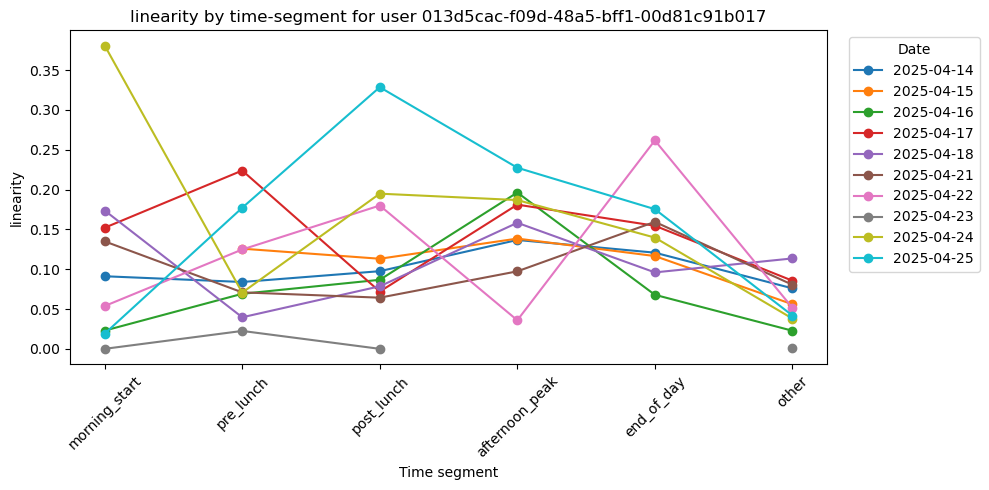

In [7]:
import matplotlib.pyplot as plt
import pandas as pd

# 1) Define the chronological order of your segments
segment_order = [
    "morning_start",
    "pre_lunch",
    "post_lunch",
    "afternoon_peak",
    "end_of_day",
    "other"
]

# 2) Make sure 'segment' is categorical so it plots in the right order
summary['segment'] = pd.Categorical(summary['segment'],
                                   categories=segment_order,
                                   ordered=True)

# 3) Sort by segment (and date if you like)
summary = summary.sort_values(['segment','date'])

# 4) Loop through each feature and plot
for feature in features:
    # pivot so rows are segments, columns are dates
    pivot = summary.pivot(index='segment', columns='date', values=feature)

    plt.figure(figsize=(10, 5))
    for dt in pivot.columns:
        plt.plot(pivot.index, pivot[dt], marker='o', label=str(dt))

    plt.title(f"{feature} by time‐segment for user {user_id}")
    plt.xlabel("Time segment")
    plt.ylabel(feature)
    plt.xticks(rotation=45)
    plt.legend(title="Date", bbox_to_anchor=(1.02, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


In [8]:
import subprocess
# replace 'MyNotebook.ipynb' with your actual notebook filename
subprocess.run([
    "jupyter", "nbconvert",
    "--to", "html",
    "--no-input",
    "--output", "eda_charts.html",
    "manual_multi_day_analysis.ipynb"
])
print("✅ Exported all existing outputs (including your plots) to eda_charts.html")


✅ Exported all existing outputs (including your plots) to eda_charts.html


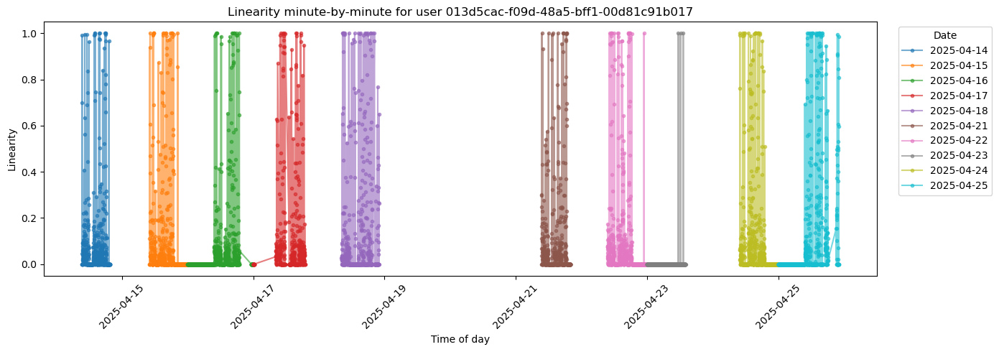

In [24]:
plt.figure(figsize=(14, 5))
for day, grp in df_user.groupby(df_user['start_date_time'].dt.date):
    plt.plot(
        grp['start_date_time'],
        grp['linearity'],
        marker='.', linestyle='-',
        alpha=0.6,
        label=str(day)
    )

plt.title(f"Linearity minute-by-minute for user {user_id}")
plt.xlabel("Time of day")
plt.ylabel("Linearity")
plt.legend(title="Date", bbox_to_anchor=(1.02,1), loc='upper left')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


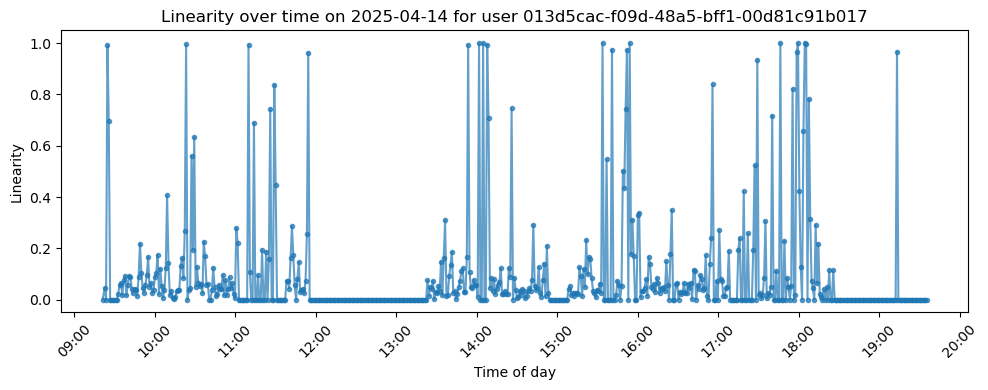

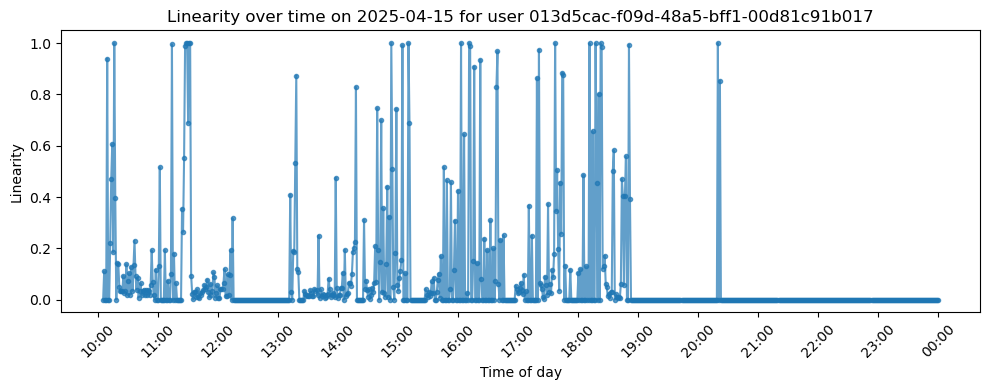

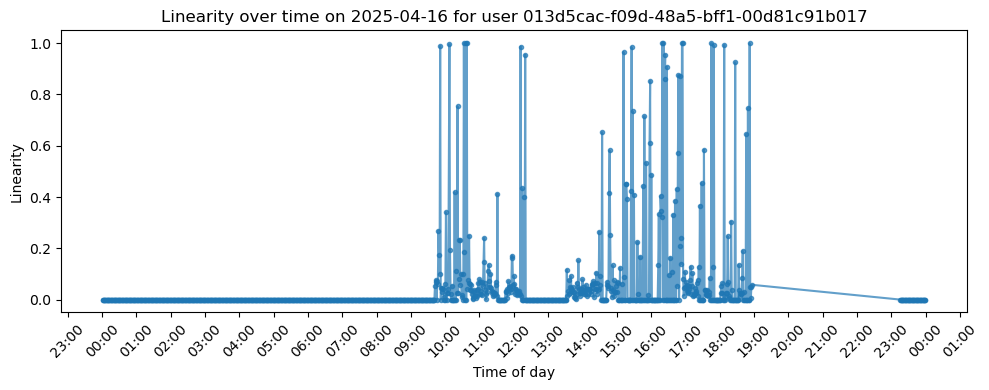

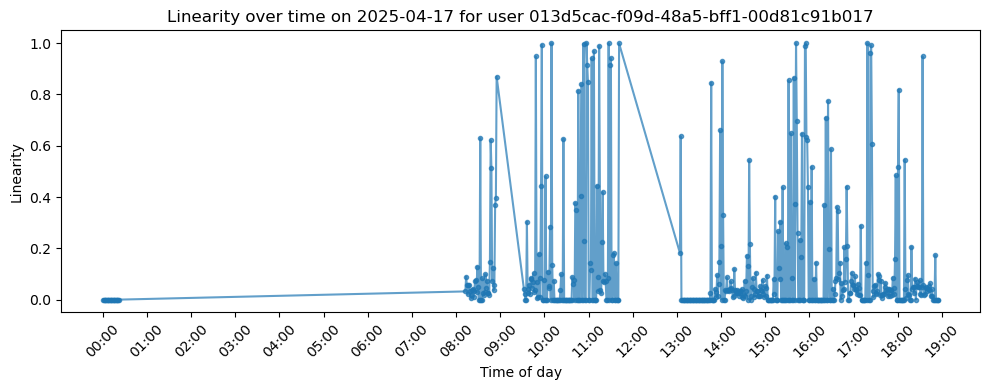

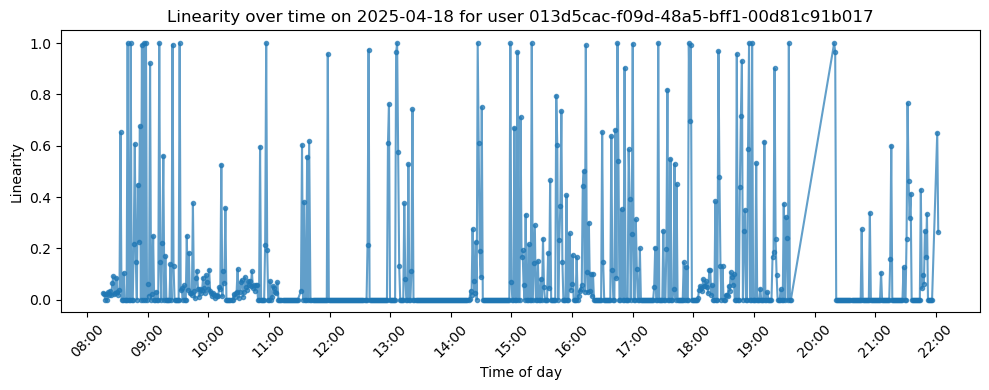

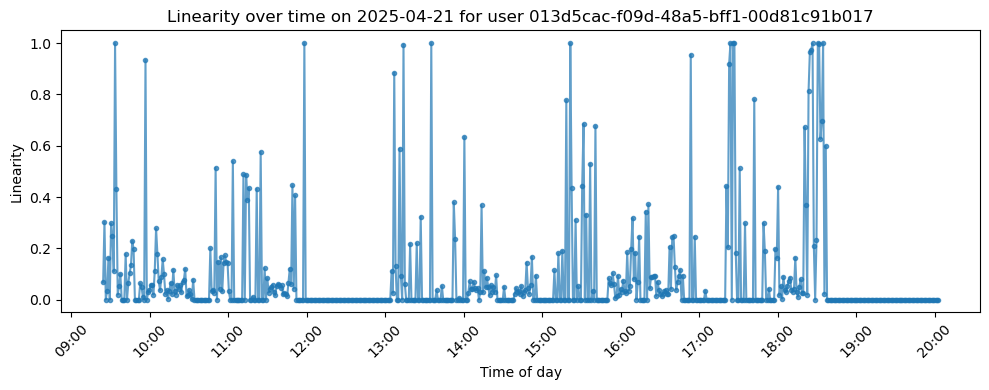

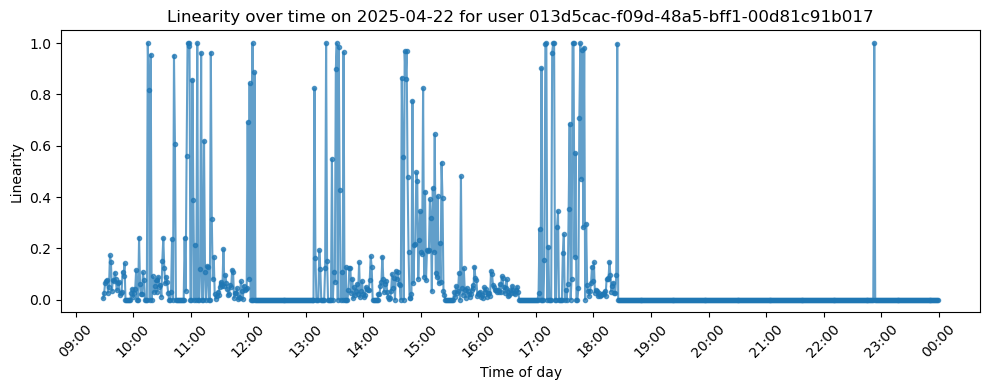

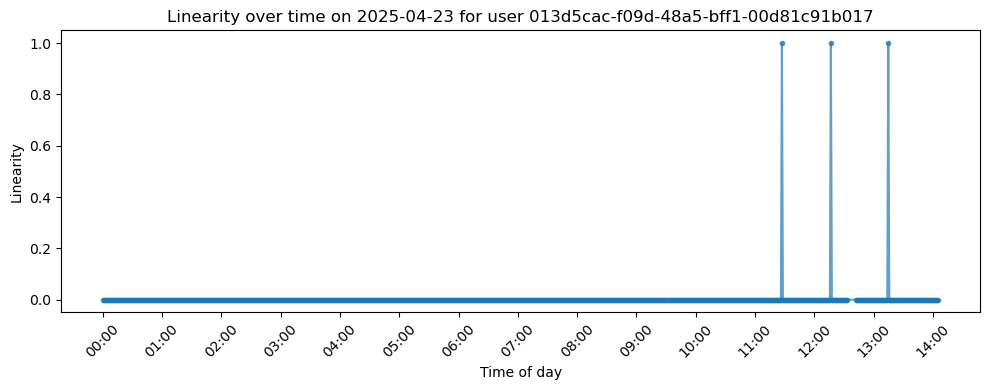

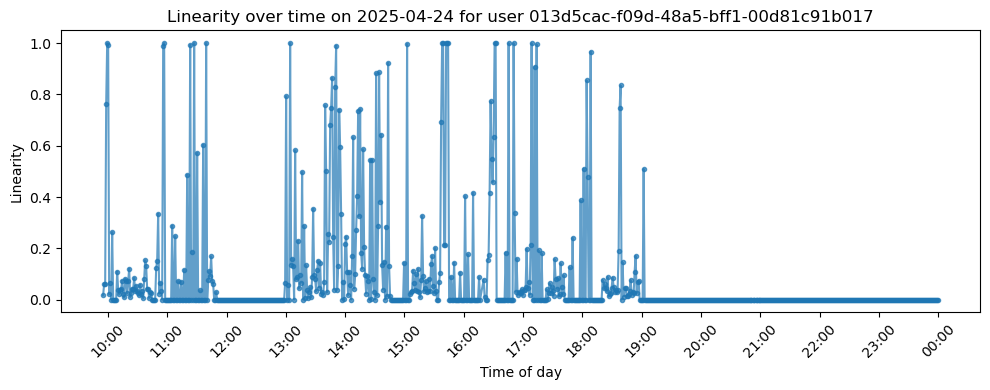

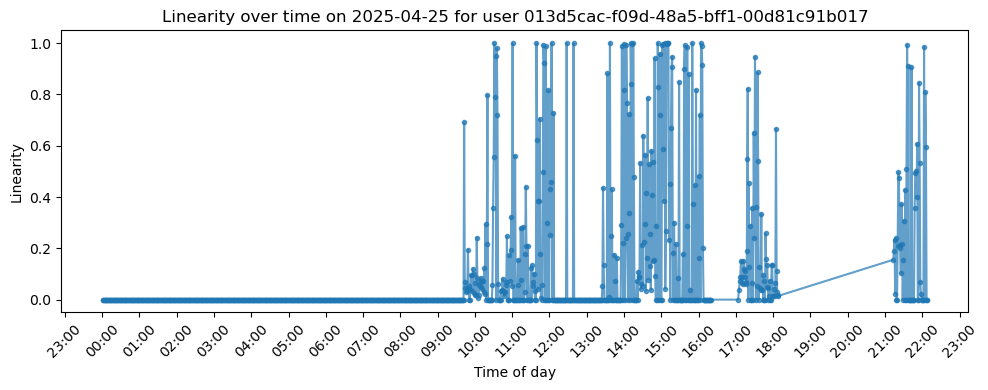

In [26]:
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.dates as mdates

# make sure your timestamps are datetime
df_user['start_date_time'] = pd.to_datetime(df_user['start_date_time'])

# group by date
for day, grp in df_user.groupby(df_user['start_date_time'].dt.date):
    # Optional: extract just the time-of-day for a cleaner x-axis
    grp = grp.copy()
    grp['time_of_day'] = grp['start_date_time'].dt.time
    
    fig, ax = plt.subplots(figsize=(10, 4))
    ax.plot(grp['start_date_time'], grp['linearity'],
            marker='.', linestyle='-',
            alpha=0.7)
    
    # Format x-axis to show only hour:minute
    ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
    
    ax.set_title(f"Linearity over time on {day} for user {user_id}")
    ax.set_xlabel("Time of day")
    ax.set_ylabel("Linearity")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()



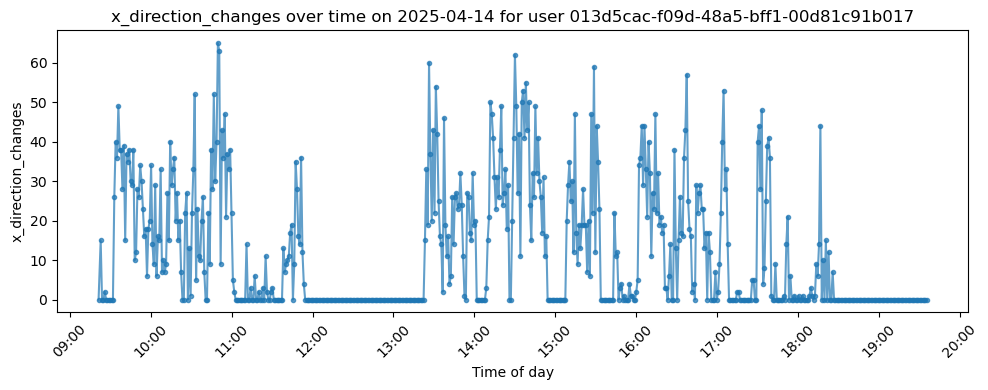

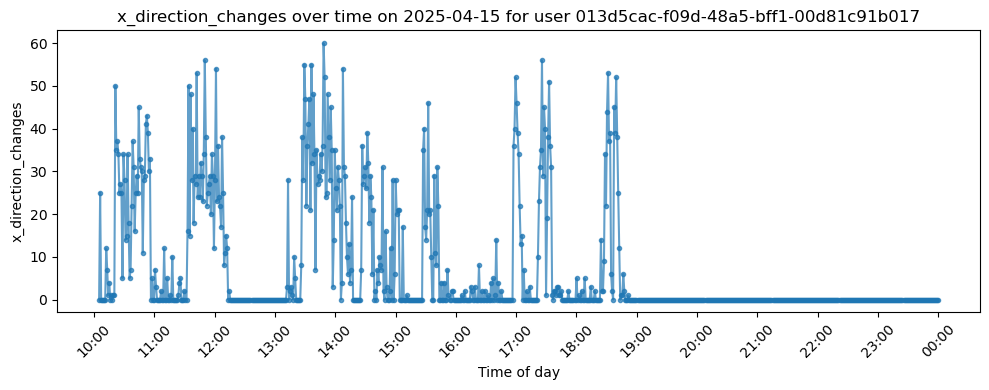

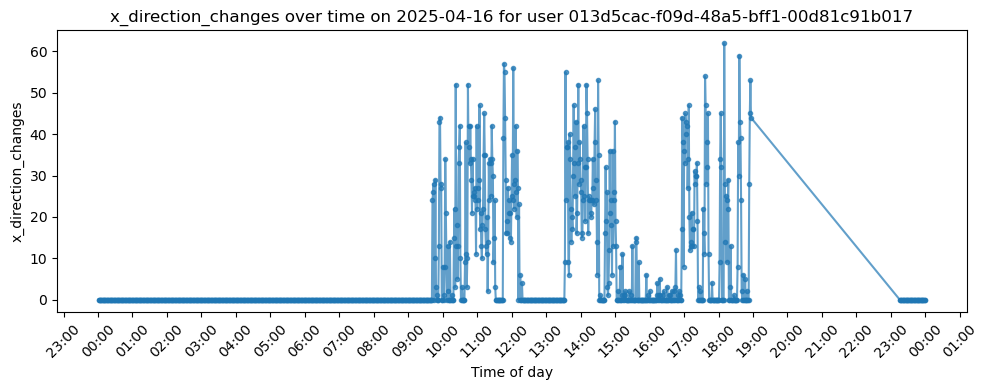

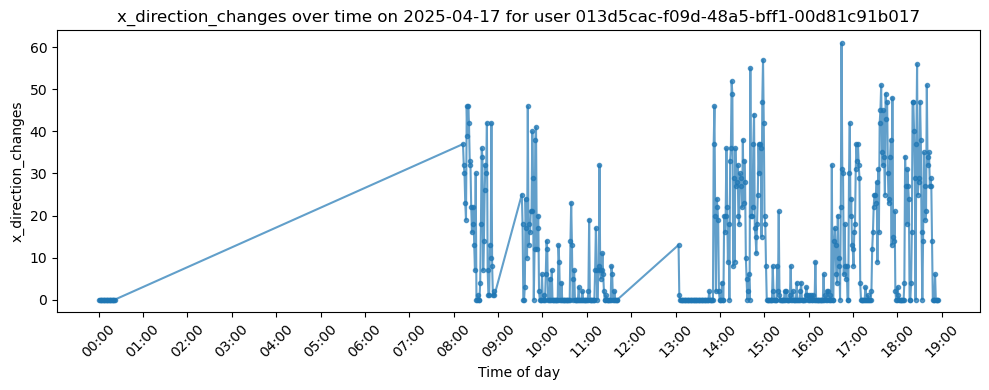

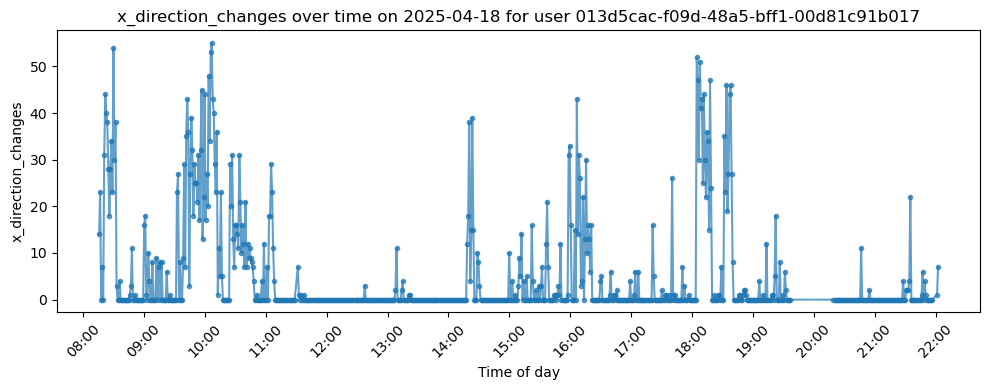

...

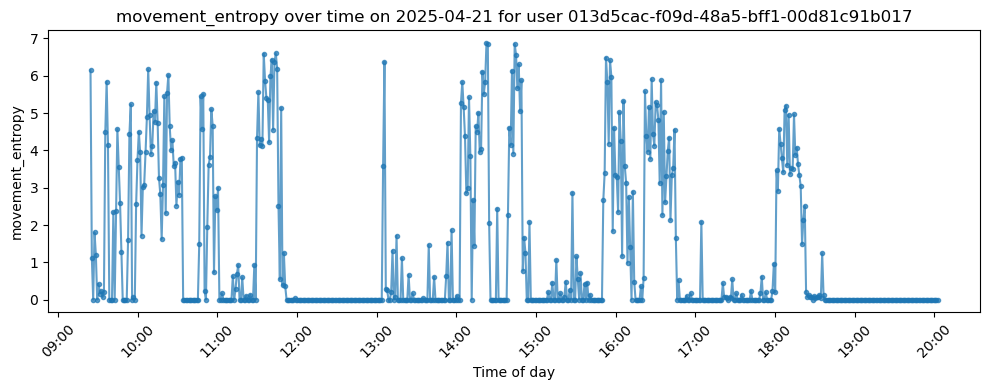

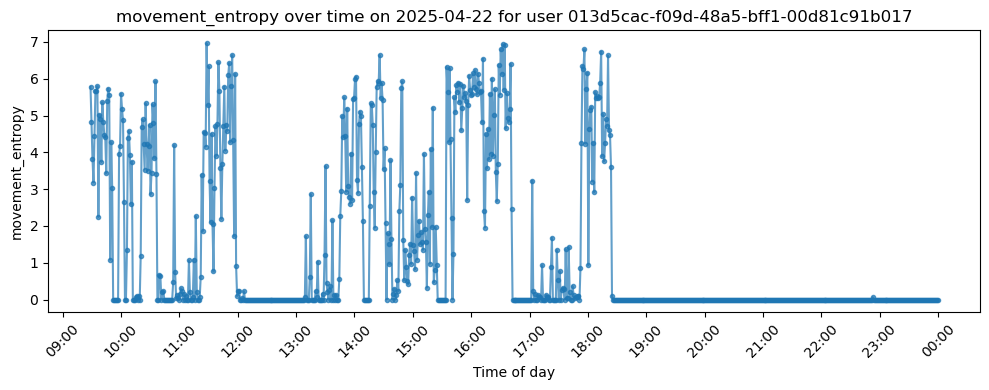

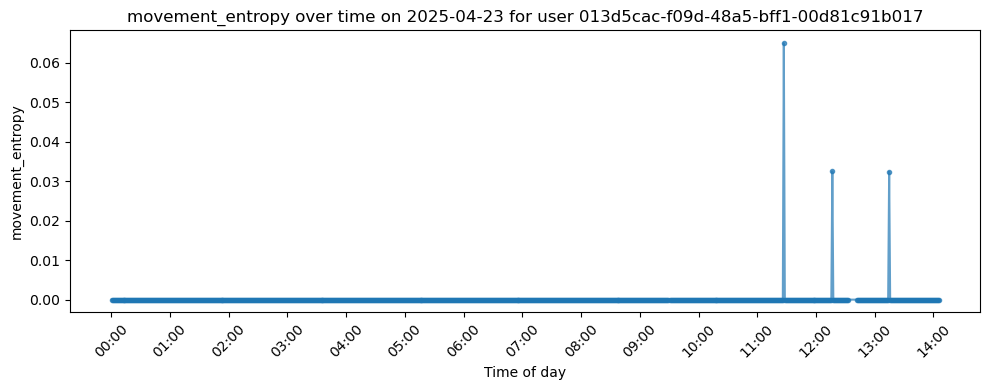

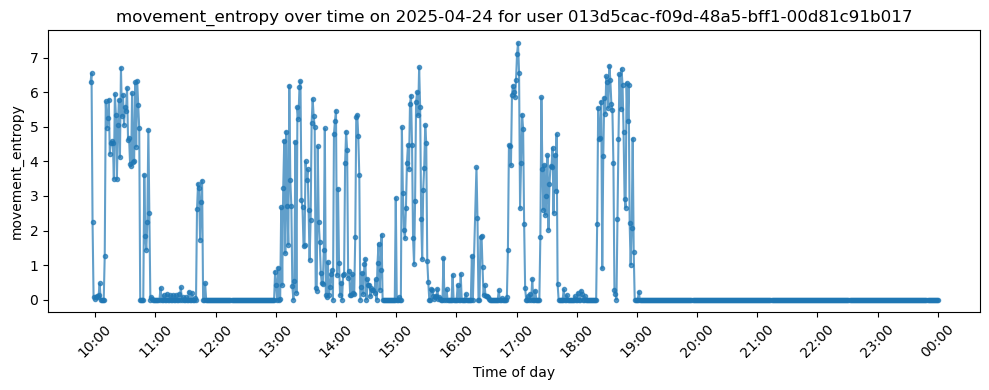

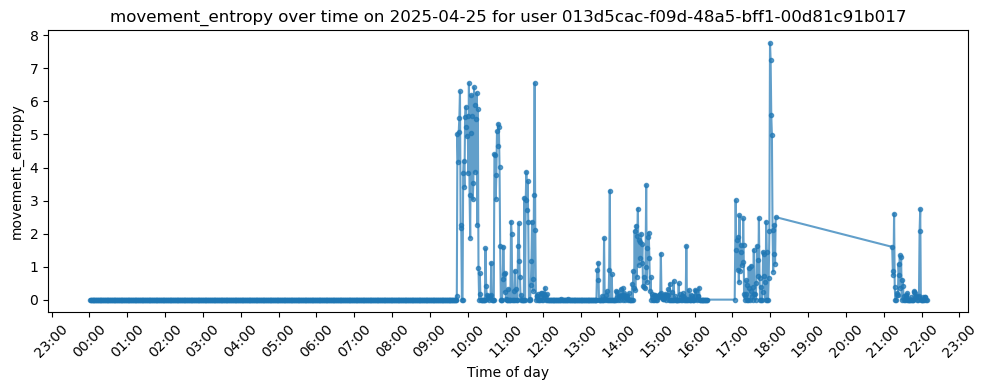

In [28]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# 1) List of the features you want to plot
features = [
    "x_direction_changes",
    "y_direction_changes",
    "bbox_area",
    "avg_speed",
    "avg_acceleration",
    "mouse_idle_ratio",
    "movement_entropy"
]

# 2) Ensure timestamp is a datetime and sorted
df_user['start_date_time'] = pd.to_datetime(df_user['start_date_time'])
df_user = df_user.sort_values('start_date_time')

# 3) Loop through features
for feature in features:
    # 4) Then loop through each calendar day
    for day, grp in df_user.groupby(df_user['start_date_time'].dt.date):
        fig, ax = plt.subplots(figsize=(10, 4))
        
        # plot raw feature over time
        ax.plot(
            grp['start_date_time'],
            grp[feature],
            marker='.', linestyle='-',
            alpha=0.7
        )
        
        # format x-axis as HH:MM
        ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
        
        ax.set_title(f"{feature} over time on {day} for user {user_id}")
        ax.set_xlabel("Time of day")
        ax.set_ylabel(feature)
        
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()


In [30]:
import io
import base64
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# --- 1) Prepare your HTML parts ---
html_parts = [
    "<!DOCTYPE html>",
    "<html><head><meta charset='utf-8'><title>Daily Feature Report</title></head><body>",
    f"<h1>Per-Day, Per-Feature Plots for user {user_id}</h1>",
]

# --- 2) Loop features and days, capture each plot ---
for feature in features + ['linearity']:  # include linearity if needed
    html_parts.append(f"<h2 style='margin-top:40px;'>{feature}</h2>")
    
    for day, grp in df_user.groupby(df_user['start_date_time'].dt.date):
        # draw the plot
        fig, ax = plt.subplots(figsize=(8, 3))
        ax.plot(
            grp['start_date_time'],
            grp[feature],
            marker='.', linestyle='-',
            alpha=0.7
        )
        ax.xaxis.set_major_locator(mdates.HourLocator(interval=1))
        ax.xaxis.set_major_formatter(mdates.DateFormatter('%H:%M'))
        ax.set_title(str(day), fontsize=10)
        ax.set_xlabel("Time")
        ax.set_ylabel(feature)
        plt.xticks(rotation=45)
        plt.tight_layout()
        
        # capture to PNG in memory
        buf = io.BytesIO()
        fig.savefig(buf, format='png', bbox_inches='tight')
        plt.close(fig)
        buf.seek(0)
        img_b64 = base64.b64encode(buf.read()).decode('utf-8')
        
        # embed in HTML
        html_parts.append(f"<div style='margin-bottom:30px;'>")
        html_parts.append(f"<h3>{day}</h3>")
        html_parts.append(f"<img src='data:image/png;base64,{img_b64}'/>")
        html_parts.append("</div>")

# --- 3) Finish HTML and write ---
html_parts.append("</body></html>")

with open("daily_feature_report.html", "w", encoding="utf-8") as f:
    f.write("\n".join(html_parts))

print("✅ Written daily_feature_report.html in your working directory.")



✅ Written daily_feature_report.html in your working directory.
